In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from google.colab import drive

drive.mount("/content/drive")

mainVideo = cv2.VideoCapture('/content/drive/MyDrive/trabalho8/video_input.mp4')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# 140 frames
def bacteries():
  contador = 0
  listCounter = []
  listBacteries = []

  time = 15 / 140 # tempo em segundos dividido pela quantidade de 140 frames que foi levada em consideração
  while(mainVideo.isOpened() and contador <=140):
    ret, frame = mainVideo.read()
    contador = contador + 1

    if not ret:
      break

    edged_image = cv2.filter2D(frame, -1, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)), borderType=cv2.BORDER_REPLICATE)

    gray = cv2.cvtColor(edged_image, cv2.COLOR_BGR2GRAY)

    _, binaria = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)

    gauss = cv2.GaussianBlur(binaria, (11, 11), 0)

    canny = cv2.Canny(gauss, 30, 150, 3)

    contornos, _ = cv2.findContours(canny.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    cv2.drawContours(rgb, contornos, -1, (0, 255, 0), 2)

    listCounter.append(contador)
    listBacteries.append(len(contornos))

    cv2_imshow(rgb)

  listTime = []
  for elemento in listCounter:
    listTime.append(elemento * time)

  plt.grid()
  plt.title("Gráfico Quantidade x Frame")
  plt.xlabel("Tempo(segundos)")
  plt.ylabel("Quantidade de Bactérias")
  plt.scatter(listTime, listBacteries)
  plt.show()

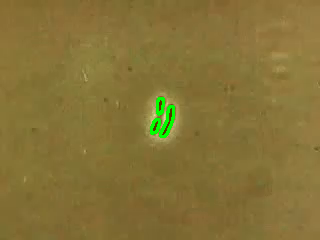

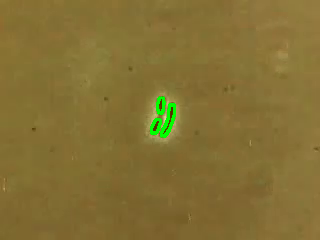

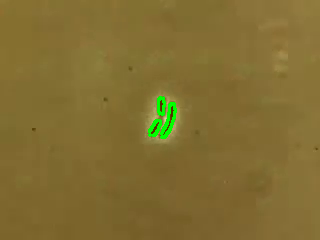

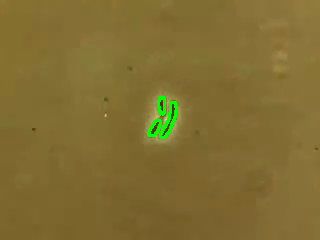

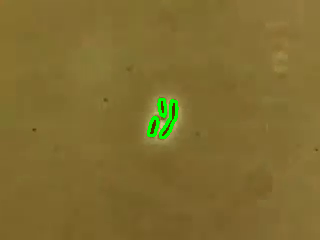

...

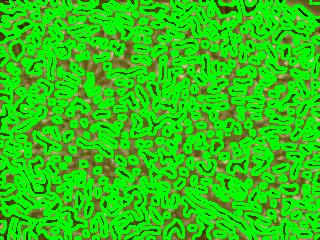

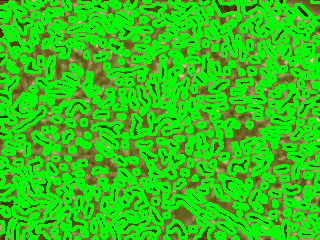

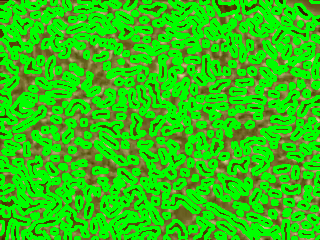

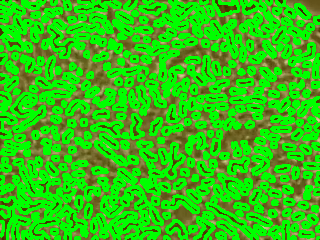

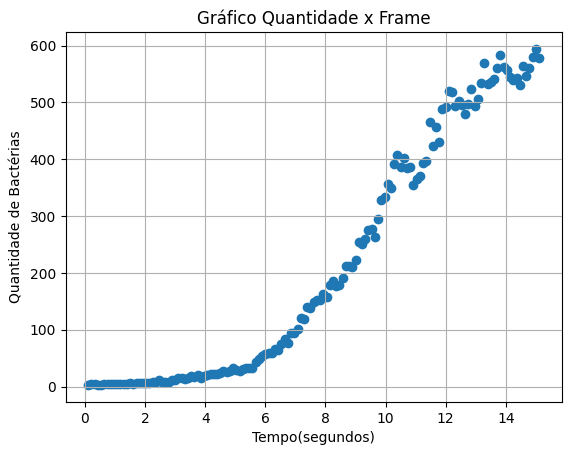

In [6]:
bacteries()